In [68]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from xgboost import XGBClassifier,plot_importance
from sklearn.metrics import accuracy_score, roc_auc_score
from sklearn.feature_selection import SelectFromModel
import re
import string
from sklearn.feature_extraction.text import CountVectorizer, TfidfTransformer
from sklearn.model_selection import train_test_split, RandomizedSearchCV, GridSearchCV, StratifiedKFold

In [4]:
data=pd.read_csv("mbti_1.csv")

In [5]:
data.head()

,type,posts
0,INFJ,'http://www.youtube.com/watch?v=qsXHcwe3krw|||...
1,ENTP,'I'm finding the lack of me in these posts ver...
2,INTP,'Good one _____ https://www.youtube.com/wat...
3,INTJ,"'Dear INTP, I enjoyed our conversation the o..."
4,ENTJ,'You're fired.|||That's another silly misconce...


In [6]:
data.shape

(8675, 2)

In [7]:
valcount = data['type'].value_counts()
valcount

INFP    1832
INFJ    1470
INTP    1304
INTJ    1091
ENTP     685
ENFP     675
ISTP     337
ISFP     271
ENTJ     231
ISTJ     205
ENFJ     190
ISFJ     166
ESTP      89
ESFP      48
ESFJ      42
ESTJ      39
Name: type, dtype: int64

In [8]:
valcount.index

Index(['INFP', 'INFJ', 'INTP', 'INTJ', 'ENTP', 'ENFP', 'ISTP', 'ISFP', 'ENTJ',
       'ISTJ', 'ENFJ', 'ISFJ', 'ESTP', 'ESFP', 'ESFJ', 'ESTJ'],
      dtype='object')

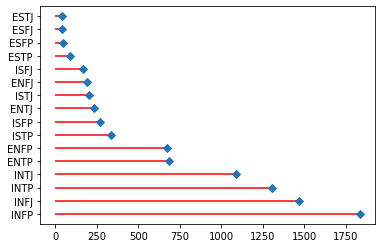

In [9]:
plt.hlines(y=list(range(16)), xmin=0, xmax=valcount, color='red')
plt.plot(valcount, list(range(16)), "D")
#plt.stem(valcount)
plt.yticks(list(range(16)), valcount.index)
plt.show()

In [10]:
data['Different_posts'] = data['posts'].apply(lambda x: x.strip().split("|||"))
data['number_posts'] = data['Different_posts'].apply(lambda x: len(x))

In [11]:
data

,type,posts,Different_posts,number_posts
0,INFJ,'http://www.youtube.com/watch?v=qsXHcwe3krw|||...,"['http://www.youtube.com/watch?v=qsXHcwe3krw, ...",50
1,ENTP,'I'm finding the lack of me in these posts ver...,['I'm finding the lack of me in these posts ve...,50
2,INTP,'Good one _____ https://www.youtube.com/wat...,['Good one _____ https://www.youtube.com/wa...,50
3,INTJ,"'Dear INTP, I enjoyed our conversation the o...","['Dear INTP, I enjoyed our conversation the ...",50
4,ENTJ,'You're fired.|||That's another silly misconce...,"['You're fired., That's another silly misconce...",50
...,...,...,...,...
8670,ISFP,'https://www.youtube.com/watch?v=t8edHB_h908||...,"['https://www.youtube.com/watch?v=t8edHB_h908,...",50
8671,ENFP,'So...if this thread already exists someplace ...,['So...if this thread already exists someplace...,50
8672,INTP,'So many questions when i do these things. I ...,['So many questions when i do these things. I...,50
8673,INFP,'I am very conflicted right now when it comes ...,['I am very conflicted right now when it comes...,50


In [12]:
valcount2 = data['number_posts'].value_counts()
valcount2

50    7587
47      82
48      79
42      61
49      60
      ... 
5        1
77       1
14       1
78       1
75       1
Name: number_posts, Length: 77, dtype: int64

In [13]:
num_post_df = data.groupby('type')['number_posts'].apply(list).reset_index()

In [14]:
def count_youtube(posts):
    count = 0
    for p in posts:
        if 'youtube' in p:
            count += 1
    return count
        
data['youtube'] = data['Different_posts'].apply(count_youtube)

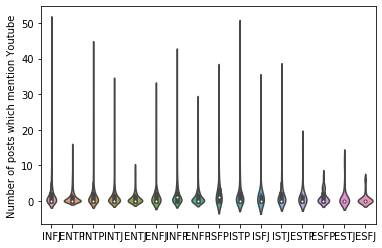

In [15]:
sns.violinplot(x='type',y='youtube',data=data)
plt.xlabel('')
plt.ylabel('Number of posts which mention Youtube')
plt.show()

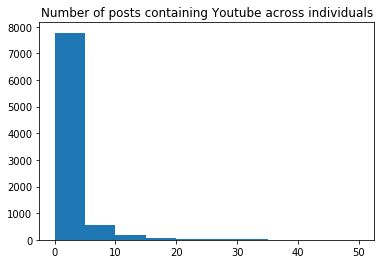

In [16]:
plt.hist(data['youtube'])
plt.title('Number of posts containing Youtube across individuals')
plt.show()

In [17]:
data['id']=data.index

In [18]:
expanded_data = pd.DataFrame(data['Different_posts'].tolist(), index=data['id']).stack().reset_index(level=1, drop=True).reset_index(name='idposts')

In [19]:
expanded_data

,id,idposts
0,0,'http://www.youtube.com/watch?v=qsXHcwe3krw
1,0,http://41.media.tumblr.com/tumblr_lfouy03PMA1q...
2,0,enfp and intj moments https://www.youtube.com...
3,0,What has been the most life-changing experienc...
4,0,http://www.youtube.com/watch?v=vXZeYwwRDw8 h...
...,...,...
422840,8674,I was going to close my facebook a few months ...
422841,8674,30 Seconds to Mars - All of my collections. It...
422842,8674,"I have seen it, and i agree. I did actually th..."
422843,8674,Ok so i have just watched Underworld 4 (Awaken...


In [20]:
expanded_data=expanded_data.join(data.set_index('id'), on='id', how = 'left')

In [21]:
expanded_data

,id,idposts,type,posts,Different_posts,number_posts,youtube
0,0,'http://www.youtube.com/watch?v=qsXHcwe3krw,INFJ,'http://www.youtube.com/watch?v=qsXHcwe3krw|||...,"['http://www.youtube.com/watch?v=qsXHcwe3krw, ...",50,14
1,0,http://41.media.tumblr.com/tumblr_lfouy03PMA1q...,INFJ,'http://www.youtube.com/watch?v=qsXHcwe3krw|||...,"['http://www.youtube.com/watch?v=qsXHcwe3krw, ...",50,14
2,0,enfp and intj moments https://www.youtube.com...,INFJ,'http://www.youtube.com/watch?v=qsXHcwe3krw|||...,"['http://www.youtube.com/watch?v=qsXHcwe3krw, ...",50,14
3,0,What has been the most life-changing experienc...,INFJ,'http://www.youtube.com/watch?v=qsXHcwe3krw|||...,"['http://www.youtube.com/watch?v=qsXHcwe3krw, ...",50,14
4,0,http://www.youtube.com/watch?v=vXZeYwwRDw8 h...,INFJ,'http://www.youtube.com/watch?v=qsXHcwe3krw|||...,"['http://www.youtube.com/watch?v=qsXHcwe3krw, ...",50,14
...,...,...,...,...,...,...,...
422840,8674,I was going to close my facebook a few months ...,INFP,'It has been too long since I have been on per...,['It has been too long since I have been on pe...,50,3
422841,8674,30 Seconds to Mars - All of my collections. It...,INFP,'It has been too long since I have been on per...,['It has been too long since I have been on pe...,50,3
422842,8674,"I have seen it, and i agree. I did actually th...",INFP,'It has been too long since I have been on per...,['It has been too long since I have been on pe...,50,3
422843,8674,Ok so i have just watched Underworld 4 (Awaken...,INFP,'It has been too long since I have been on per...,['It has been too long since I have been on pe...,50,3


In [22]:
expanded_data=expanded_data.drop(columns=['posts','Different_posts','number_posts','youtube'])


In [23]:
def clean_text(text):
    result = re.sub(r'http[^\s]*', '',text)
    result = re.sub('[0-9]+','', result).lower()
    result = re.sub('@[a-z0-9]+', 'user', result)
    return re.sub('[%s]*' % string.punctuation, '',result)

In [24]:
final_data = expanded_data.copy()

In [29]:
final_data['idposts'] = final_data['idposts'].apply(clean_text)


In [32]:
final_data


,id,idposts,type
0,0,,INFJ
1,0,,INFJ
2,0,enfp and intj moments sportscenter not top ...,INFJ
3,0,what has been the most lifechanging experience...,INFJ
4,0,on repeat for most of today,INFJ
...,...,...,...
422840,8674,i was going to close my facebook a few months ...,INFP
422841,8674,seconds to mars all of my collections it see...,INFP
422842,8674,i have seen it and i agree i did actually thin...,INFP
422843,8674,ok so i have just watched underworld awakenin...,INFP


In [45]:
cleaned_data = final_data.groupby('id')['idposts'].apply(list).reset_index()

In [47]:
cleaned_data

,id,idposts
0,0,"[, , enfp and intj moments sportscenter not..."
1,1,[im finding the lack of me in these posts very...
2,2,"[good one , of course to which i say i kno..."
3,3,[dear intp i enjoyed our conversation the ot...
4,4,"[youre fired, thats another silly misconceptio..."
...,...,...
8670,8670,"[, ixfp just because i always think of cats as..."
8671,8671,[soif this thread already exists someplace els...
8672,8672,[so many questions when i do these things i w...
8673,8673,[i am very conflicted right now when it comes ...


In [51]:
data['clean_post'] = cleaned_data['idposts'].apply(lambda x: ' '.join(x))

In [52]:
data.head()

,type,posts,Different_posts,number_posts,youtube,id,clean_post
0,INFJ,'http://www.youtube.com/watch?v=qsXHcwe3krw|||...,"['http://www.youtube.com/watch?v=qsXHcwe3krw, ...",50,14,0,enfp and intj moments sportscenter not to...
1,ENTP,'I'm finding the lack of me in these posts ver...,['I'm finding the lack of me in these posts ve...,50,1,1,im finding the lack of me in these posts very ...
2,INTP,'Good one _____ https://www.youtube.com/wat...,['Good one _____ https://www.youtube.com/wa...,50,3,2,good one of course to which i say i know ...
3,INTJ,"'Dear INTP, I enjoyed our conversation the o...","['Dear INTP, I enjoyed our conversation the ...",50,2,3,dear intp i enjoyed our conversation the oth...
4,ENTJ,'You're fired.|||That's another silly misconce...,"['You're fired., That's another silly misconce...",50,1,4,youre fired thats another silly misconception ...


In [55]:
vectorizer = CountVectorizer(stop_words = ['and','the','to','of',
                                           'infj','entp','intp','intj',
                                           'entj','enfj','infp','enfp',
                                           'isfp','istp','isfj','istj',
                                           'estp','esfp','estj','esfj',
                                           'infjs','entps','intps','intjs',
                                           'entjs','enfjs','infps','enfps',
                                           'isfps','istps','isfjs','istjs',
                                           'estps','esfps','estjs','esfjs'],
                                            max_features=1500,analyzer="word",max_df=0.8,min_df=0.1)

In [56]:
corpus = data['clean_post'].values.reshape(1,-1).tolist()[0]
vectorizer.fit(corpus)
X_cnt = vectorizer.fit_transform(corpus)

In [57]:
X_cnt

<8675x871 sparse matrix of type '<class 'numpy.int64'>'
	with 1981186 stored elements in Compressed Sparse Row format>

In [58]:
tfizer = TfidfTransformer()
tfizer.fit(X_cnt)
X = tfizer.fit_transform(X_cnt).toarray()

In [59]:
all_words = vectorizer.get_feature_names()
n_words = len(all_words)

In [60]:
data['fav_world'] = data['type'].apply(lambda x: 1 if x[0] == 'E' else 0)
data['info'] = data['type'].apply(lambda x: 1 if x[1] == 'S' else 0)
data['decision'] = data['type'].apply(lambda x: 1 if x[2] == 'T' else 0)
data['structure'] = data['type'].apply(lambda x: 1 if x[3] == 'J' else 0)

In [62]:
data.head()

,type,posts,Different_posts,number_posts,youtube,id,clean_post,fav_world,info,decision,structure
0,INFJ,'http://www.youtube.com/watch?v=qsXHcwe3krw|||...,"['http://www.youtube.com/watch?v=qsXHcwe3krw, ...",50,14,0,enfp and intj moments sportscenter not to...,0,0,0,1
1,ENTP,'I'm finding the lack of me in these posts ver...,['I'm finding the lack of me in these posts ve...,50,1,1,im finding the lack of me in these posts very ...,1,0,1,0
2,INTP,'Good one _____ https://www.youtube.com/wat...,['Good one _____ https://www.youtube.com/wa...,50,3,2,good one of course to which i say i know ...,0,0,1,0
3,INTJ,"'Dear INTP, I enjoyed our conversation the o...","['Dear INTP, I enjoyed our conversation the ...",50,2,3,dear intp i enjoyed our conversation the oth...,0,0,1,1
4,ENTJ,'You're fired.|||That's another silly misconce...,"['You're fired., That's another silly misconce...",50,1,4,youre fired thats another silly misconception ...,1,0,1,1


In [63]:
X_df = pd.DataFrame.from_dict({w: X[:, i] for i, w in enumerate(all_words)})

In [66]:
def sub_classifier(keyword):
    y_f = data[keyword].values
    X_f_train, X_f_test, y_f_train, y_f_test = train_test_split(X_df, y_f, stratify=y_f)
    f_classifier = XGBClassifier()
    print(">>> Train classifier ... ")
    f_classifier.fit(X_f_train, y_f_train, 
                     early_stopping_rounds = 10, 
                     eval_metric="logloss", 
                     eval_set=[(X_f_test, y_f_test)], verbose=False)
    print(">>> Finish training")
    print("%s:" % keyword, sum(y_f)/len(y_f))
    print("Accuracy %s" % keyword, accuracy_score(y_f_test, f_classifier.predict(X_f_test)))
    print("AUC %s" % keyword, roc_auc_score(y_f_test, f_classifier.predict_proba(X_f_test)[:,1]))
    return f_classifier

In [69]:
fav_classifier = sub_classifier('fav_world')

>>> Train classifier ... 
>>> Finish training
fav_world: 0.2304322766570605
Accuracy fav_world 0.7616413093591516
AUC fav_world 0.6460239664469742


In [70]:
info_classifier = sub_classifier('info')

>>> Train classifier ... 
>>> Finish training
info: 0.13798270893371758
Accuracy info 0.8593822037805441
AUC info 0.6416620463935042


In [71]:
decision_classifier = sub_classifier('decision')

>>> Train classifier ... 
>>> Finish training
decision: 0.4589048991354467
Accuracy decision 0.7113877362840019
AUC decision 0.7883891347709587


In [72]:
str_classifier = sub_classifier('structure')

>>> Train classifier ... 
>>> Finish training
structure: 0.395850144092219
Accuracy structure 0.6399262332872291
AUC structure 0.6388268801819976


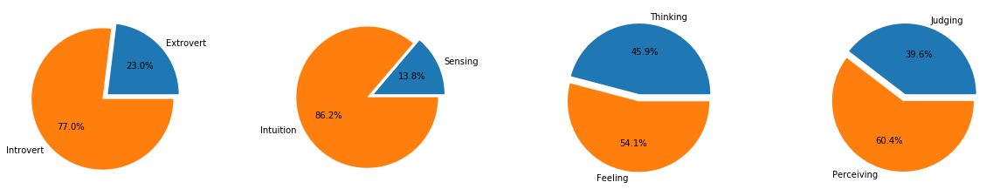

In [75]:
from pylab import rcParams
rcParams['figure.figsize'] = 20, 10
plt.subplots_adjust(wspace = 0.5)
ax1 = plt.subplot(1, 4, 1)
plt.pie([sum(data['fav_world']), 
         len(data['fav_world']) - sum(data['fav_world'])], 
        labels = ['Extrovert', 'Introvert'],
        explode = (0, 0.1),
       autopct='%1.1f%%')

ax2 = plt.subplot(1, 4, 2)
plt.pie([sum(data['info']), 
         len(data['info']) - sum(data['info'])], 
        labels = ['Sensing', 'Intuition'],
        explode = (0, 0.1),
       autopct='%1.1f%%')

ax3 = plt.subplot(1, 4, 3)
plt.pie([sum(data['decision']), 
         len(data['decision']) - sum(data['decision'])], 
        labels = ['Thinking', 'Feeling'],
        explode = (0, 0.1),
       autopct='%1.1f%%')

ax4 = plt.subplot(1, 4, 4)
plt.pie([sum(data['structure']), 
         len(data['structure']) - sum(data['structure'])], 
        labels = ['Judging', 'Perceiving'],
        explode = (0, 0.1),
       autopct='%1.1f%%')

plt.show()

In [76]:
fav_classifier.get_xgb_params()

{'objective': 'binary:logistic',
 'base_score': 0.5,
 'booster': 'gbtree',
 'colsample_bylevel': 1,
 'colsample_bynode': 1,
 'colsample_bytree': 1,
 'gamma': 0,
 'gpu_id': -1,
 'interaction_constraints': '',
 'learning_rate': 0.300000012,
 'max_delta_step': 0,
 'max_depth': 6,
 'min_child_weight': 1,
 'monotone_constraints': '()',
 'n_jobs': 0,
 'num_parallel_tree': 1,
 'random_state': 0,
 'reg_alpha': 0,
 'reg_lambda': 1,
 'scale_pos_weight': 1,
 'subsample': 1,
 'tree_method': 'exact',
 'validate_parameters': 1,
 'verbosity': None}

In [77]:
params = {
        'min_child_weight': [1, 5],
        'gamma': [0.5, 1, 1.5, 2],
        'subsample': [0.6, 0.8, 1.0],
        'colsample_bytree': [0.6, 0.8, 1.0],
        'max_depth': [3, 5, 7]
        }

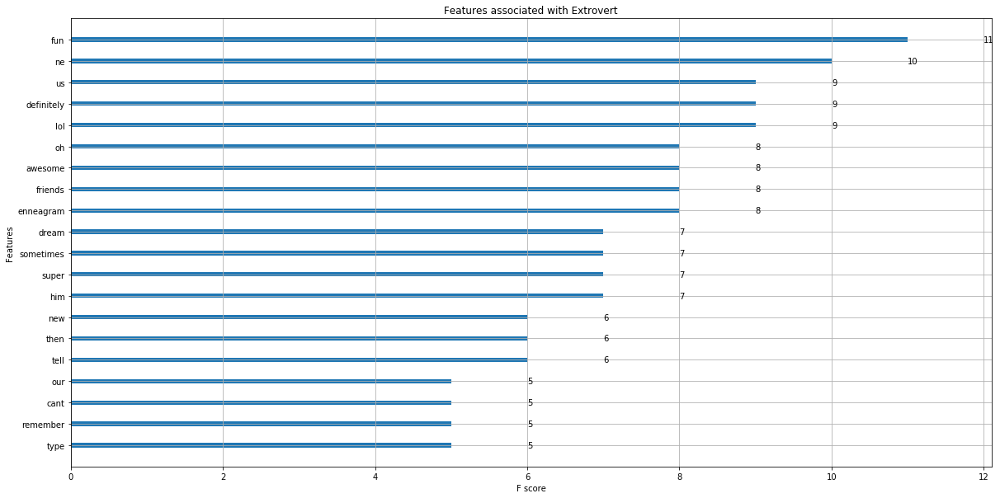

In [78]:
plot_importance(fav_classifier, max_num_features = 20)
plt.title("Features associated with Extrovert")
plt.show()

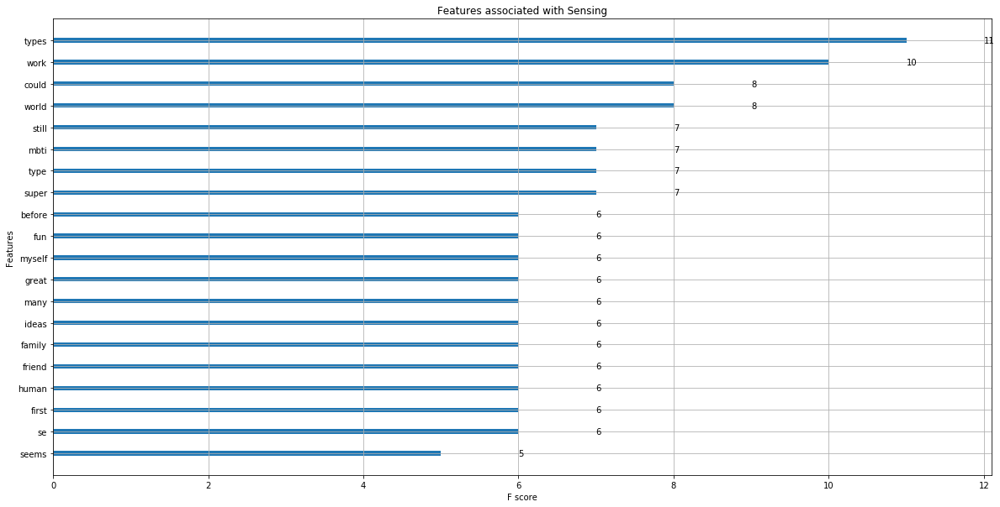

In [79]:
plot_importance(info_classifier, max_num_features = 20)
plt.title("Features associated with Sensing")
plt.show()

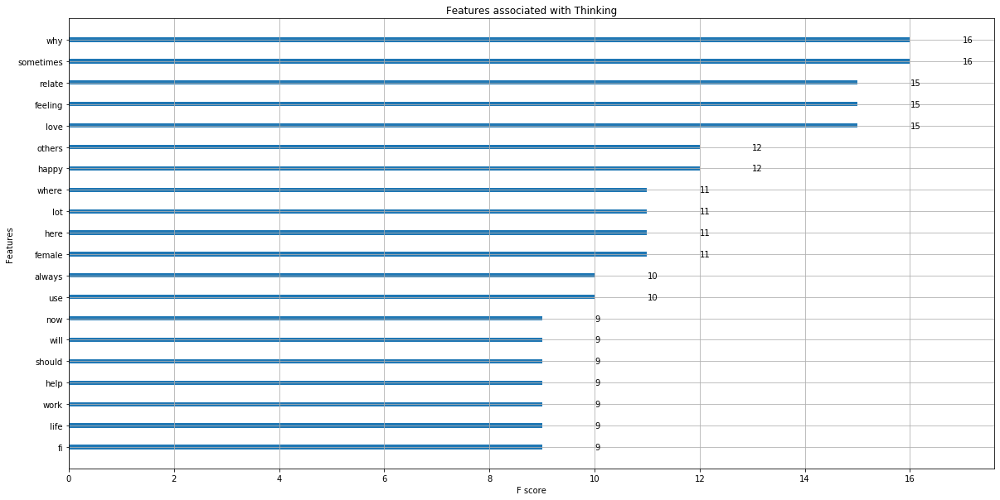

In [80]:
plot_importance(decision_classifier, max_num_features=20)
plt.title("Features associated with Thinking")
plt.show()

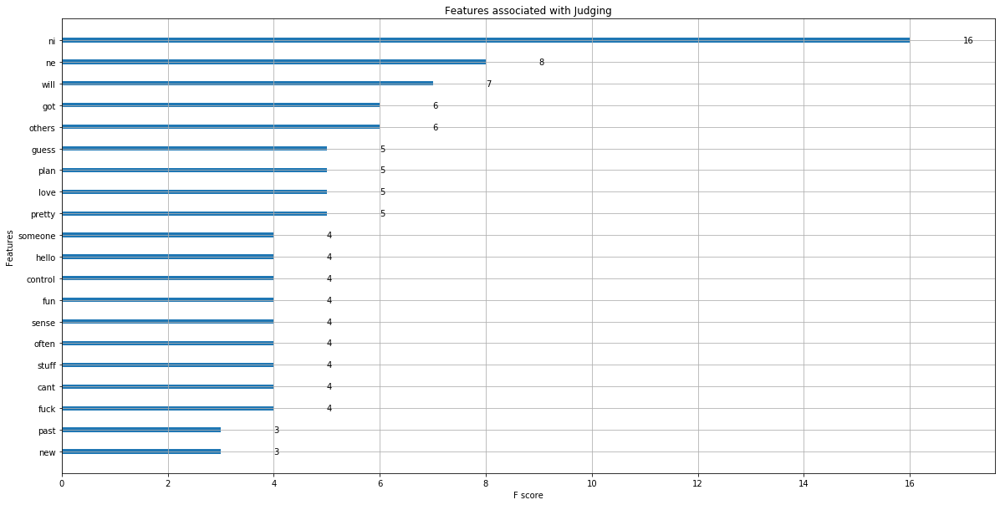

In [81]:
plot_importance(str_classifier, max_num_features=20)
plt.title("Features associated with Judging")
plt.show()

In [92]:
def generate_wordcloud(text, title):
    # Create and generate a word cloud image:
    from wordcloud import WordCloud, STOPWORDS
    wordcloud = WordCloud(background_color="white").generate(text)

    # Display the generated image:
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis("off")
    plt.title(title, fontsize = 40)
    plt.show()

In [93]:
df_by_personality = data.groupby("type")['clean_post'].apply(' '.join).reset_index()

In [94]:
df_by_personality.head()

,type,clean_post
0,ENFJ,o i went through a break up some months ago ...
1,ENFP,he doesnt want to go on the trip without me so...
2,ENTJ,youre fired thats another silly misconception ...
3,ENTP,im finding the lack of me in these posts very ...
4,ESFJ,why not any other esfjs originally mistype as ...


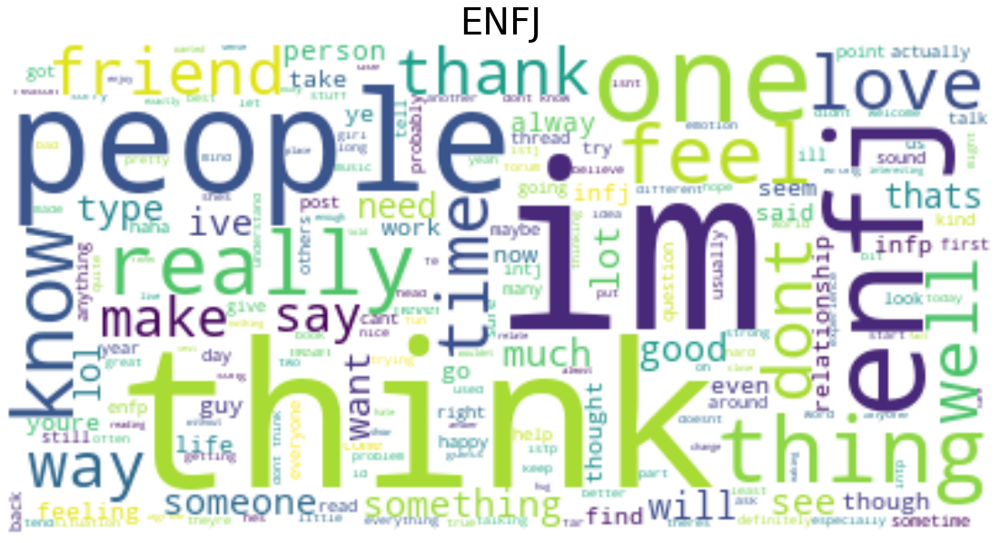

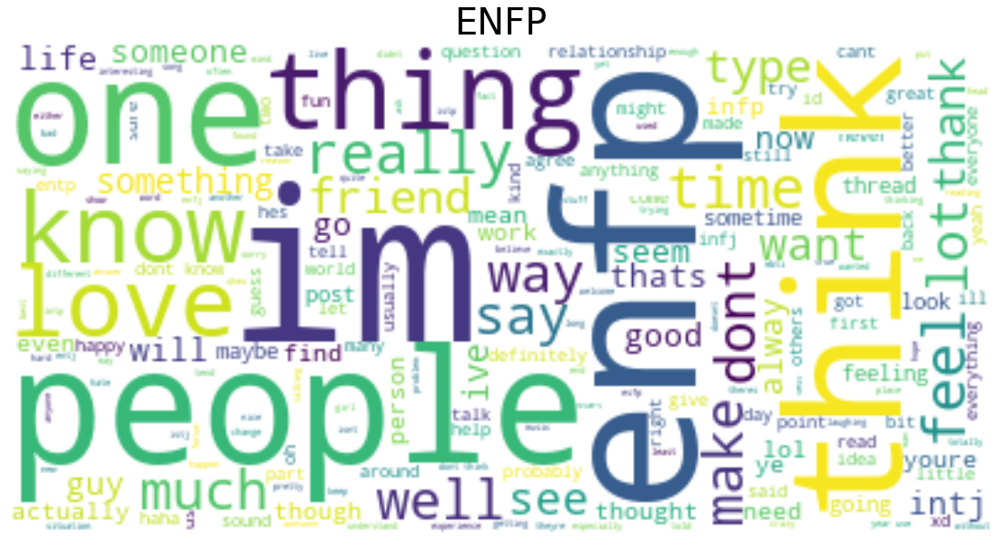

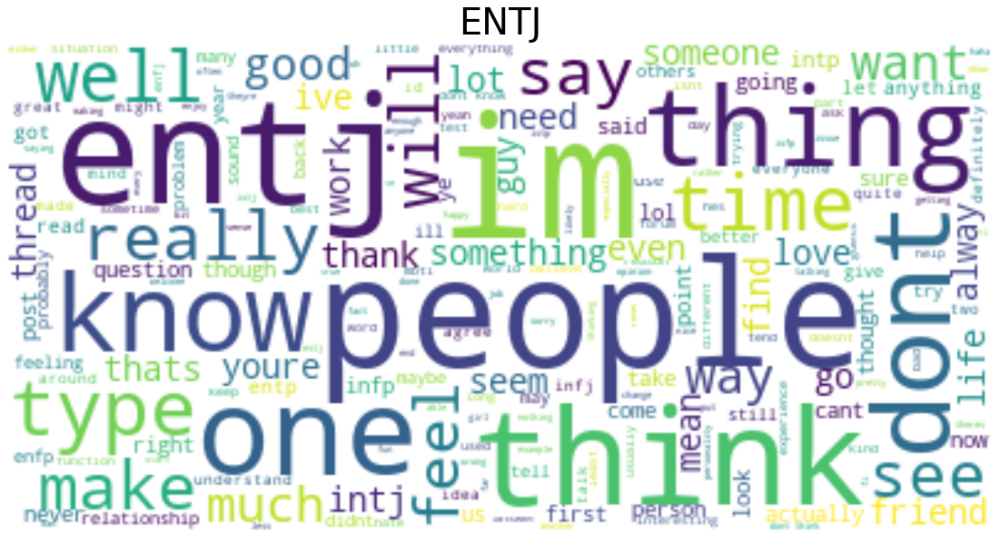

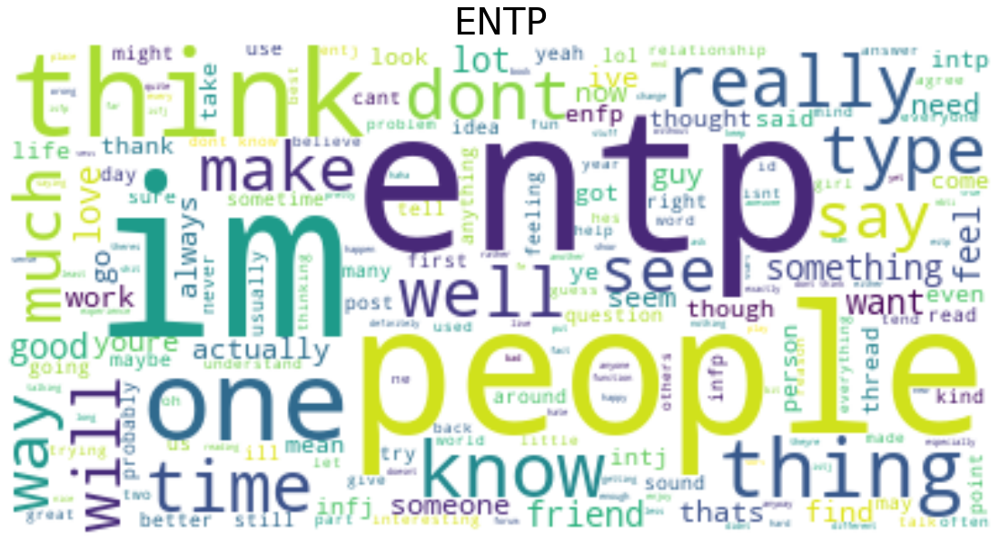

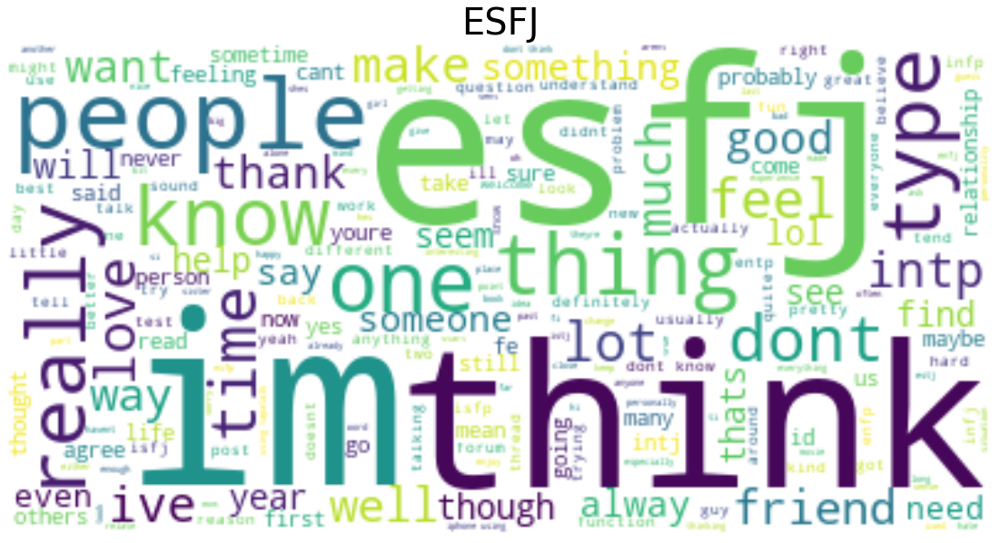

...

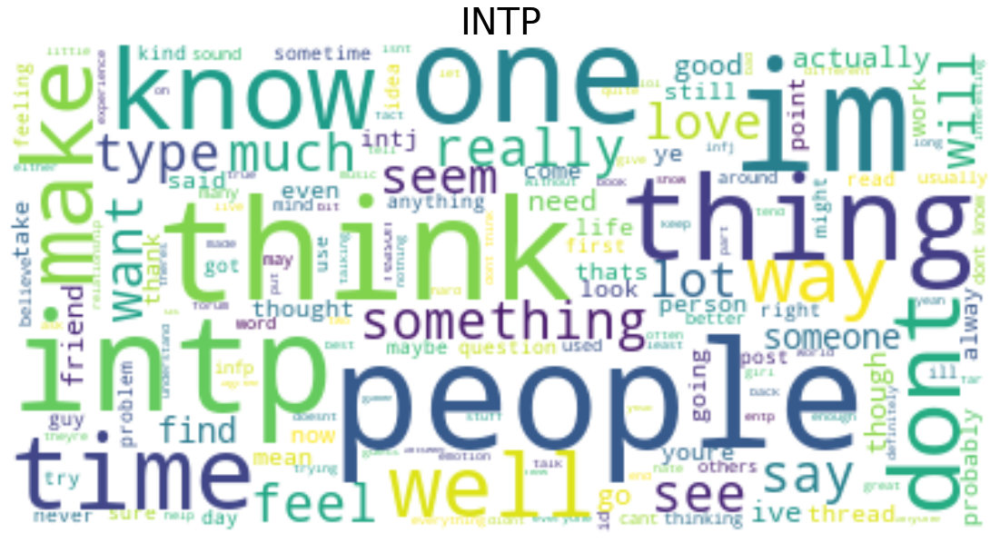

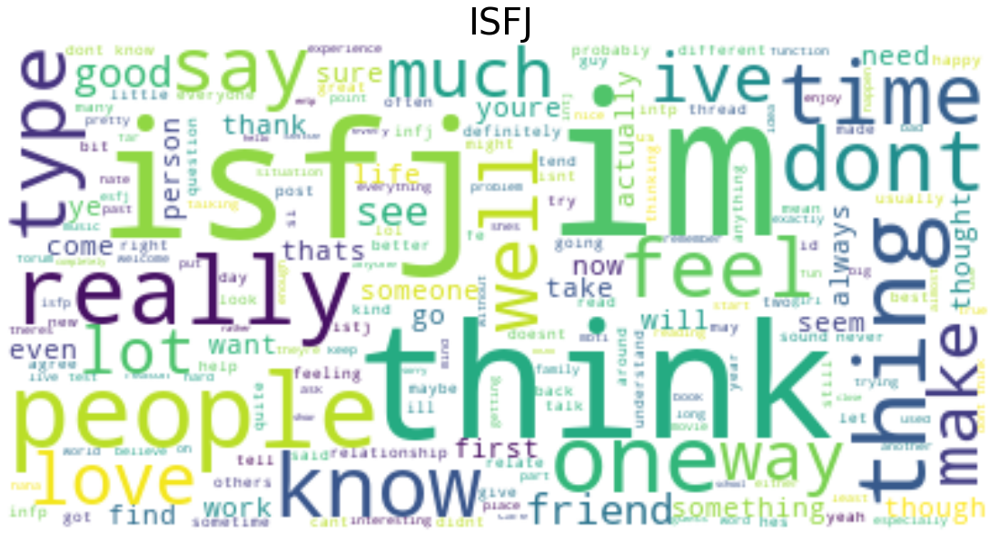

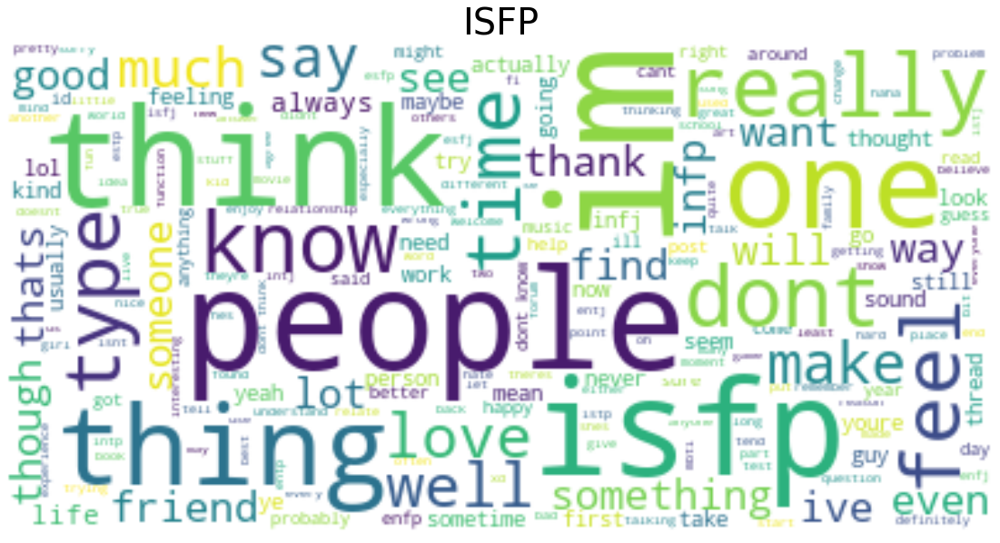

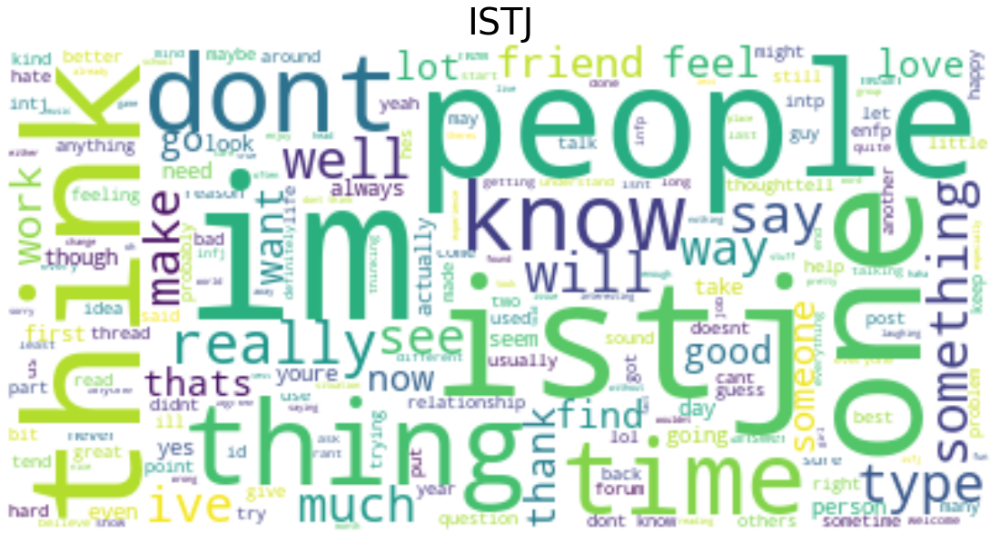

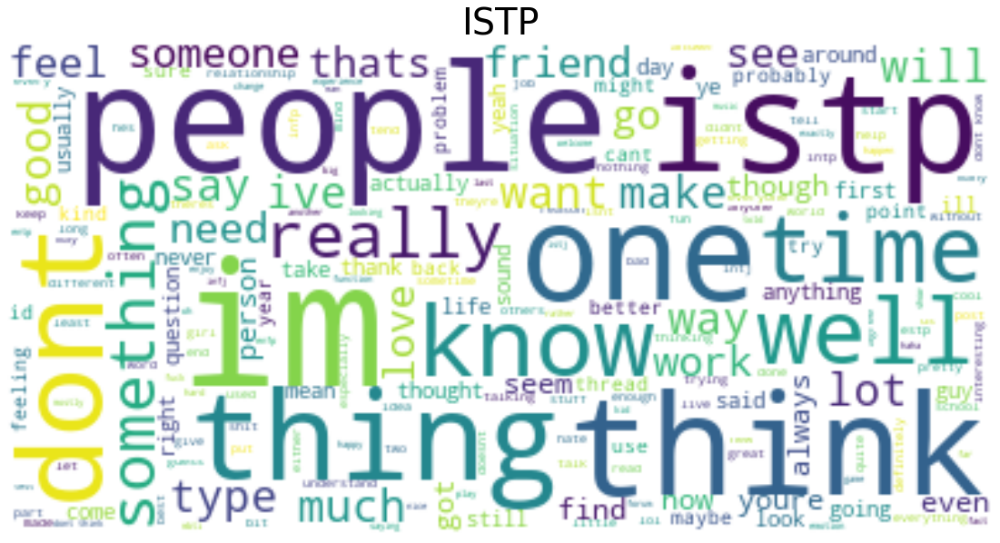

In [97]:
for i, t in enumerate(df_by_personality['type']):
    text = df_by_personality.iloc[i,1]
    generate_wordcloud(text, t)

In [99]:
test_string = 'I like to observe, think, and analyze to find cons and pros. Based on my analysis, I like to create a solution based on cost effective analysis to maximize the resource to improve the performance. I like talking to my friends. I like to read and learn. I simulate a lot of different situations to see how I would react. I read or watch a lot to improve myself. I love talking to them and seeing what they have been up to. I have a variety of friends, and I appreciate they all experience different things. Listening to their emotion, experience, and life is always great.'.lower()
final_test = tfizer.transform(vectorizer.transform([test_string])).toarray()

In [100]:
test_point = pd.DataFrame.from_dict({w: final_test[:, i] for i, w in enumerate(all_words)})

In [101]:
fav_classifier.predict_proba(test_point)

array([[0.855194  , 0.14480604]], dtype=float32)

In [102]:
info_classifier.predict_proba(test_point)

array([[0.8532725 , 0.14672749]], dtype=float32)

In [103]:
decision_classifier.predict_proba(test_point) 

array([[0.69054866, 0.30945134]], dtype=float32)

In [104]:
str_classifier.predict_proba(test_point)

array([[0.58631825, 0.41368172]], dtype=float32)